## Computer Vision

### Module 4. Geometry and Augmented Reality

#### Task 4.4:
    1. Implement 8-point algorithm
    2. Take 3 photos of the UCU building from different sides having >= 8 shared points on smartphone
    3. Undistort photos
    4. Find fundamental matricies
    5. Draw epipolar lines for all pairs of points
    6. How stable is 8-point algorithm to point location?


by Anastasiia Kasprova

    Link to Google Colab: https://colab.research.google.com/drive/1jYOjKESw-nG9Ko7OT7aQrGH0m_VhEEOc
    Link to github: https://github.com/kasprova/CV_UCU/tree/master/module4/tasks/task4

In [21]:
!ls data/epipolar_lines/

center_sheptytskogo1.jpg
center_sheptytskogo2.jpg
center_sheptytskogo3.jpg


In [22]:
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
%matplotlib inline

In [23]:
#display an image
def display_image(img, title = ""):
    plt.rcParams["figure.figsize"] = (10,10)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if title:
        plt.title(title)
    plt.show()

#### 1. Implement 8-point algorithm

In [24]:
def from_pts_to_matrix(pts):
    """
    input: 2xN array
        [[x1,y1],[x2,y2],[x3,y3],...[xN,yN]]
    output: 3xN array
        |x1 x2 x3 ... xN|
        |y1 y2 y3 ... yN|
        | 1  1  1 ...  1|
        or in python representation
        [[x1,x2,x3,...,xN],
         [y1,y2,y3,...,yN],
         [ 1, 1, 1,..., 1]]
        
    """
    return np.append(pts.T, [np.ones(pts.shape[0])], axis=0)

def normalise2dpts(pts):
    #transform pts point into matrix representation
    pts_m = from_pts_to_matrix(pts)

    #find centroids of x and y arrays
    centroid_x, centroid_y, _ = np.mean(pts_m, axis=1)

    #shift origin to centroid
    new_px = pts_m[:,0] - centroid_x
    new_py = pts_m[:,1] - centroid_y

    mean_distrib = np.mean(np.sqrt(new_px**2 + new_py**2))

    scale = np.sqrt(2)/mean_distrib

    T = np.array([[scale, 0, -scale*centroid_x],
         [0, scale, -scale*centroid_y],
         [0, 0, 1]], np.float32)
    pts_norm = np.dot(T,pts_m)
    
    return pts_norm, T

def find_fundamental_matrix(pts1,pts2):
    
    #perform normalization - translation and scaling
    pts1_norm, T1 = normalise2dpts(pts1)
    pts2_norm, T2 = normalise2dpts(pts2)
    
    A = np.array([
        pts2_norm[0]*pts1_norm[0], 
        pts2_norm[0]*pts1_norm[1],
        pts2_norm[0],
        pts2_norm[1]*pts1_norm[0],
        pts2_norm[1]*pts1_norm[1],
        pts2_norm[1],
        pts1_norm[0],
        pts1_norm[1],
        np.ones(pts1.shape[0])
    ], np.float32).T
    #since A*vec(F)=0 fundamental matrix F can be extacted from singular vector of V corresponding 
    #to smallest singular value - eigenvector
    #U,D,V = svd(A)::matlab
    U,D,V = np.linalg.svd(A)
    
    #F = reshape(V(:,9),3,3)::matlab
    F = V[-1].reshape(3,3) #corresponds to the smallest eigenvector
    
    #force F to be rank 2 matrix - lower rank approximation by svd
    #U,D,V = svd(F)::matlab
    U,D,V = np.linalg.svd(F)
    
    #F = U*diag([D(1,1) D(2,2) 0])*V::matlab
    F = np.dot(np.dot(U,np.diag([D[0],D[1],0])),V)

    #denormalize::matlab
    #F = T2*F*T1
    F = np.dot(np.dot(T2.T,F),T1)
    return F


def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,3)
        img1 = cv2.circle(img1,tuple(pt1),5,color,20)
        img2 = cv2.circle(img2,tuple(pt2),5,color,20)
    return img1,img2

color = [(0,0,255),
        (0,255,0),
        (255,0,0),
        (255,255,0),
        (0,255,255),
        (255,0,255),
        (177,0,0),
        (0,177,0)]


def find_epipolar_lines(pts, which_image, F):
    """
    input:  pts - points to compare
            which_image - image with given points (possible values - 1 or 2)
            F - fundamental matrix
    output: lines on another image we compare
    """
    lines = []
    for p in pts:
        point = np.array([p[0],p[1],1])
        if which_image == 1:
            lines.append(np.dot(F,point))
        elif which_image == 2:
            lines.append(np.dot(F.T,point))
    return lines

#### 2. Undistort photos

Implementation and parameters of my smartphone can be found here: https://colab.research.google.com/drive/1aZke8WZEJjiC4_GtI77c1gxK5rdA5wYR

In [25]:
def undistored(img, mtx, dist):
    (w,h) = img.shape[:2]
    newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
    return  dst

In [26]:
#camera calibration matrix
#    |fx  0 cx|
#K = |0  fy cy|
#    |0   0  1|
#fx,fy - focal length
#cx,cy - optical axis center (in pixels)

matrix = np.array([  [2347.99239,         0, 1269.70491],
                     [0,         2350.98604, 900.426718],
                     [0,                  0,          1]])
#distorscion coefficients
#D = <k1,k2,p1,p2,k3>
#k1,k2,k3 - lens distorsion koeficient
#p1,p2 - sensor distorsion coeficients
dst = np.array([[ 0.1365309,  -0.45435649,  0.00172709,  0.00061719,  0.41139634]])

In [27]:
#collect imges names
img_folder = "data/epipolar_lines/"
img_list = os.listdir(img_folder)

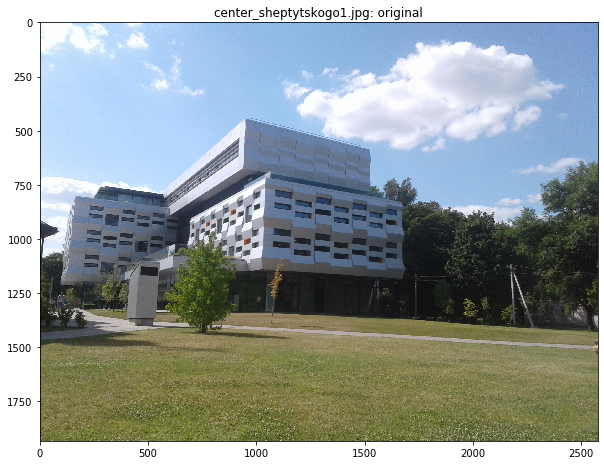

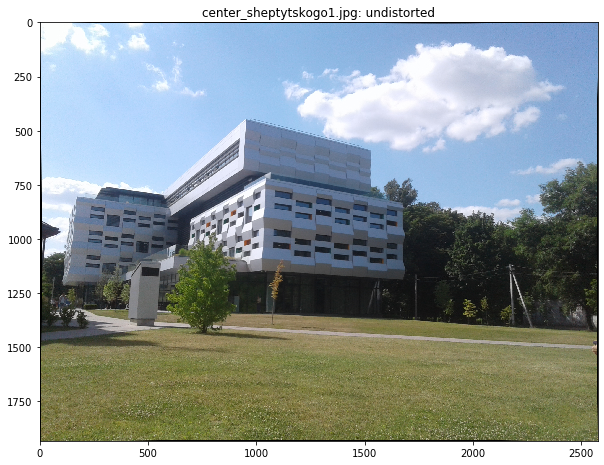

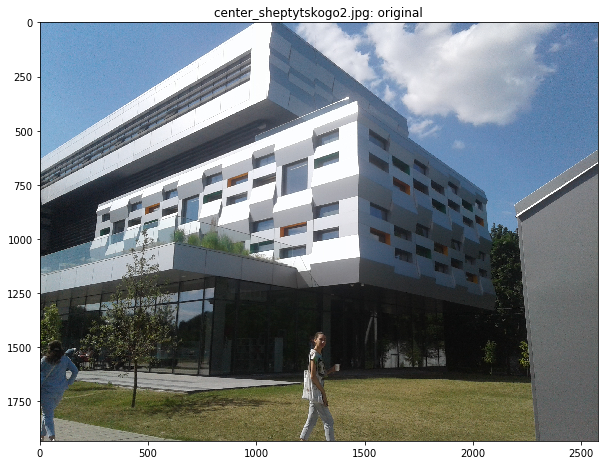

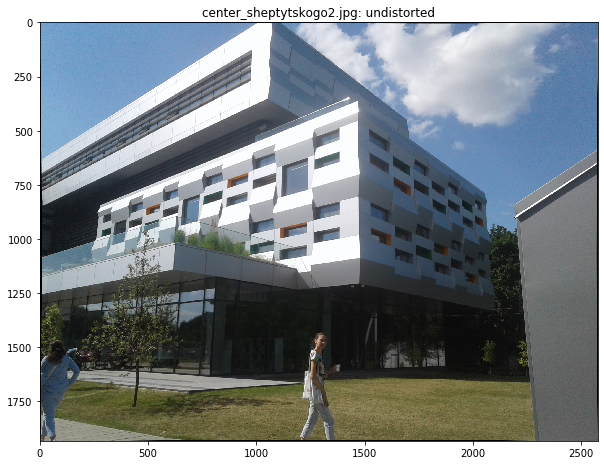

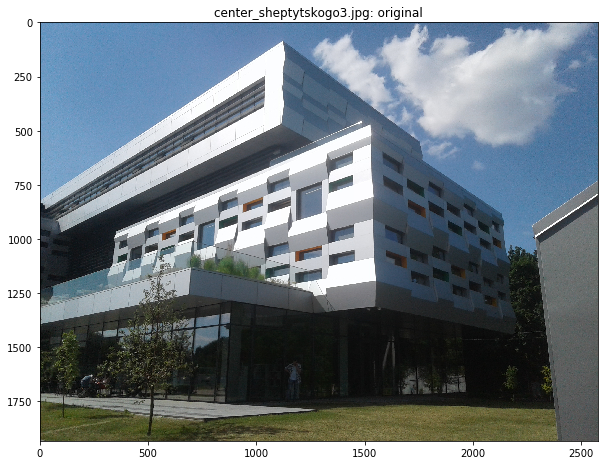

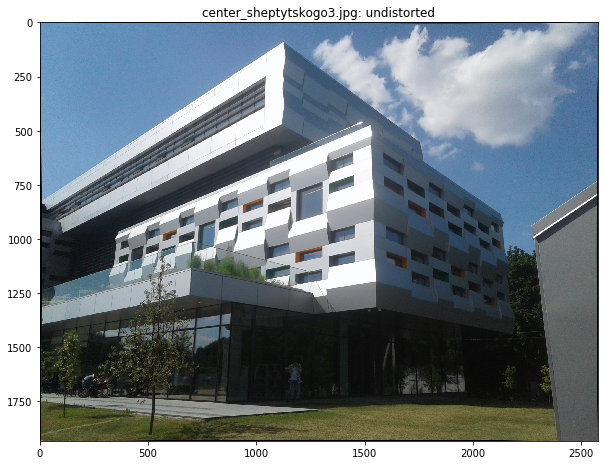

In [28]:
#display images before undistorsion and after
for i in img_list:
    img = cv2.imread(img_folder+i)
    display_image(img,i+": original")
    img_dst = undistored(img, matrix, dst)
    display_image(img_dst,i+": undistorted")

#### 3. Find fundamental matricies

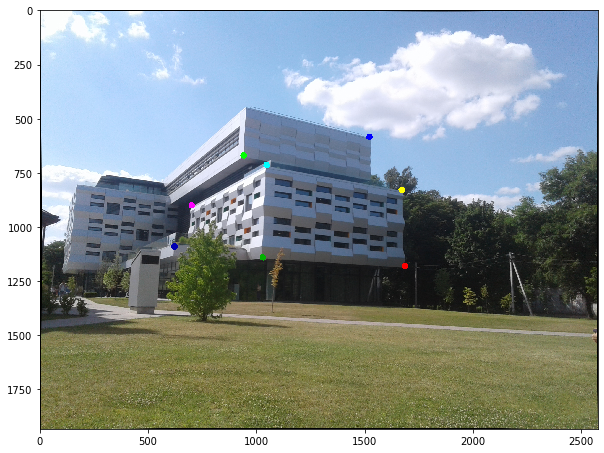

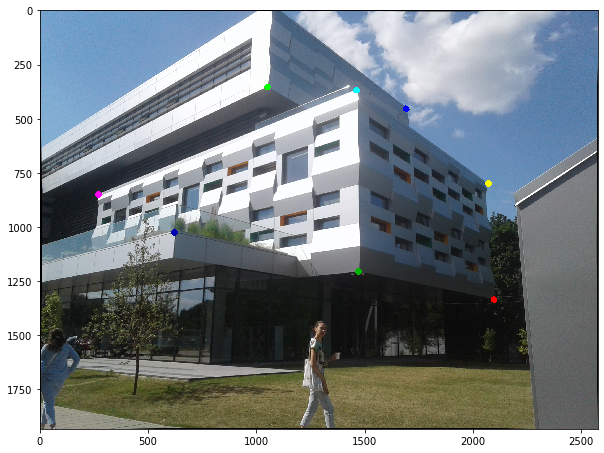

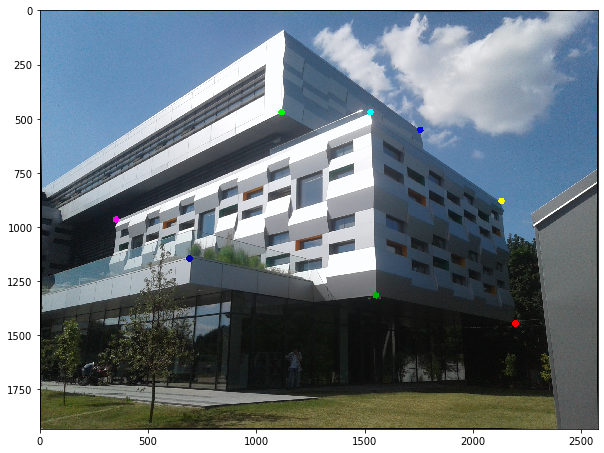

In [29]:
#manualy select points
#center_sheptytskogo1.jpg
pts_1 = np.array([   [1685,1180],
                    [940, 670],
                    [1520,585],
                    [1046, 714],
                    [1670, 830],
                    [700, 900],
                    [620,1090],
                    [1028,1140]
], np.int32)

#center_sheptytskogo2.jpg
pts_2 = np.array([[2095,1335],
                    [1050, 355],
                    [1690,455],
                    [1460,370],
                    [2070, 800],
                    [270, 850],
                    [620, 1025],
                    [1470,1205]
], np.int32)

#center_sheptytskogo3.jpg
pts_3 = np.array([   [2195,1445],
                    [1115, 470], 
                    [1755,552],
                    [1525,470],
                    [2130, 880],
                    [350, 965],
                    [690,1145],
                    [1550,1315]
                ], np.int32)

#some intermediate preparations - to be able to pick up points
#display points on images
img1 = cv2.imread(img_folder+img_list[0]).copy()
img1 = undistored(img1, matrix, dst)
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
for i, p in enumerate(pts_1):
    img1 = cv2.circle(img1, (p[0], p[1]), 5,  color[i], 20)
display_image(img1)

img2 = cv2.imread(img_folder+img_list[1]).copy()
img2 = undistored(img2, matrix, dst)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
for i, p in enumerate(pts_2):
    img2 = cv2.circle(img2, (p[0], p[1]), 5, color[i], 20)
display_image(img2)

img3 = cv2.imread(img_folder+img_list[2]).copy()
img3 = undistored(img3, matrix, dst)
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
for i, p in enumerate(pts_3):
    img3 = cv2.circle(img3, (p[0], p[1]), 5,  color[i], 20)
display_image(img3)

In [30]:
#find fundamental matrix
#F = (K2.inversed.trasposed*E*K1.inversed)
#(x2',y2',1)*F*((x1',y1',1).T)
F13 = find_fundamental_matrix(pts_1,pts_3)
F12 = find_fundamental_matrix(pts_1,pts_2)
F23 = find_fundamental_matrix(pts_2,pts_3)
print(F12)
print(F23)
print(F13)

[[ 1.41673583e-08  6.05219158e-07 -7.62884611e-04]
 [-7.30595724e-07 -2.62081451e-08  4.82957879e-05]
 [ 1.03476701e-03  6.00481446e-04 -7.78250477e-01]]
[[-2.21996450e-08  1.04012011e-06 -3.73405013e-05]
 [-1.04648105e-06 -2.77296495e-08  1.29622229e-03]
 [ 2.06914087e-04 -1.33019107e-03 -1.73078885e-01]]
[[-3.76132679e-08  4.85298103e-07 -6.46889394e-04]
 [-6.05288896e-07  1.02911830e-07 -1.78997199e-04]
 [ 1.11203326e-03  6.13495896e-04 -7.36590041e-01]]


#### 4. Build epipolarlines for all pairs of points

#### Image1 and Image2

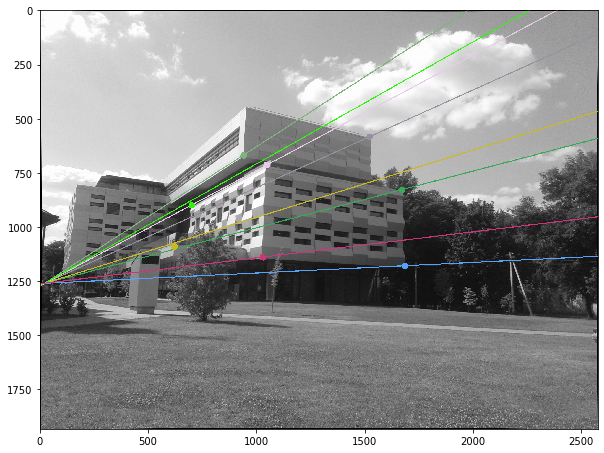

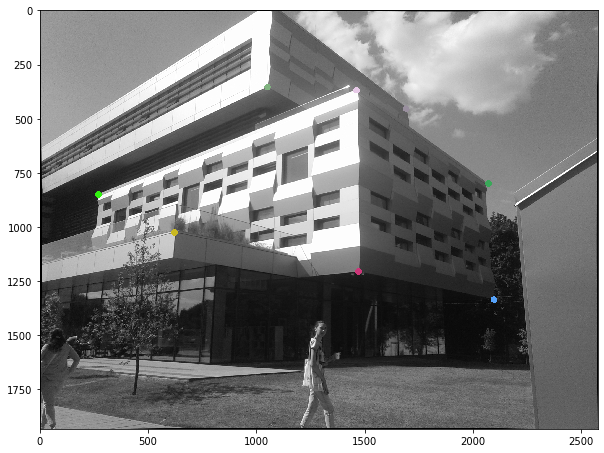

In [31]:
lines12 = find_epipolar_lines(pts_2,2, F12)
img1_, img2_ = drawlines(img1_gray, img2_gray, lines12, pts_1, pts_2)
plt.figure(1)
plt.imshow(img1_)
plt.figure(2)
plt.imshow(img2_)
plt.show()

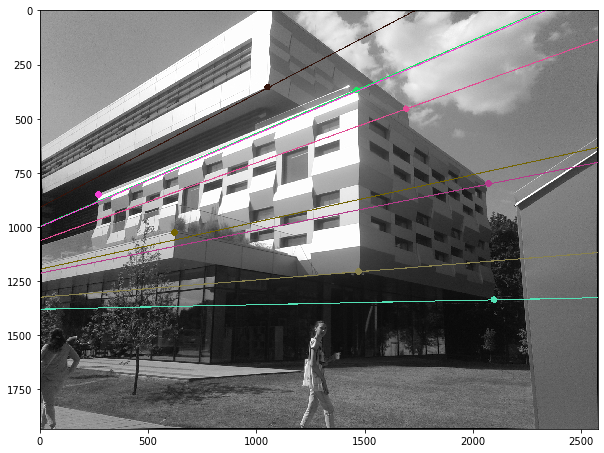

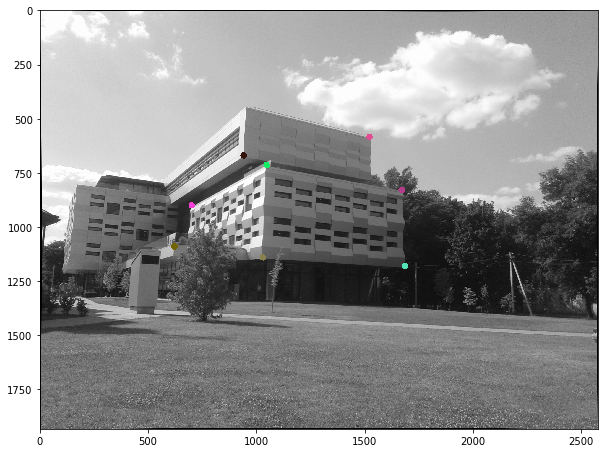

In [32]:
lines21 = find_epipolar_lines(pts_1, 1,F12)
img1__, img2__ = drawlines(img2_gray, img1_gray, lines21, pts_2, pts_1)
plt.figure(1)
plt.imshow(img1__)
plt.figure(2)
plt.imshow(img2__)
plt.show()

####  Image1 and Image3

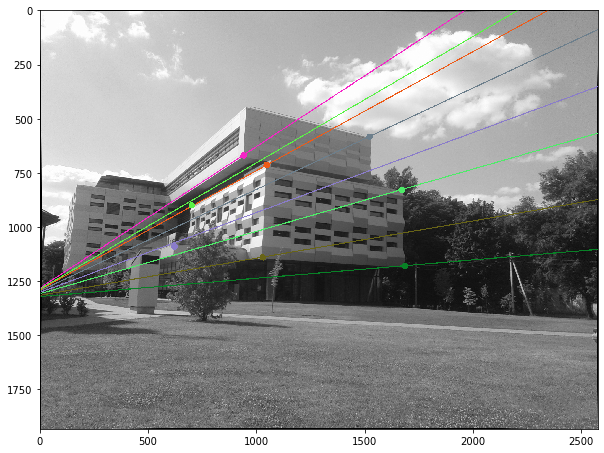

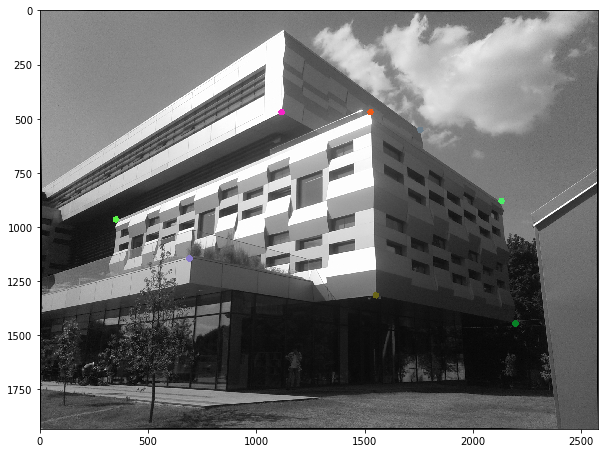

In [33]:
lines13 = find_epipolar_lines(pts_3, 2, F13)
img1_, img3_ = drawlines(img1_gray, img3_gray, lines13, pts_1, pts_3)
plt.figure(1)
plt.imshow(img1_)
plt.figure(2)
plt.imshow(img3_)
plt.show()

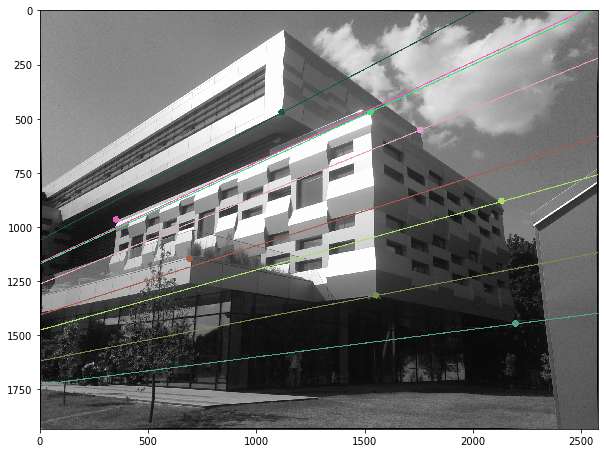

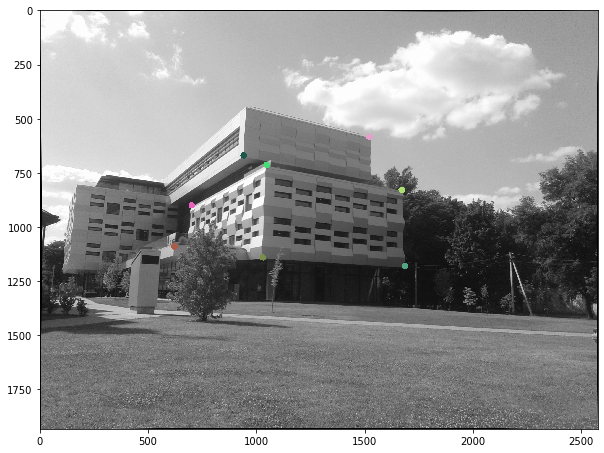

In [34]:
lines31 = find_epipolar_lines(pts_1, 1, F13)
img1__, img3__ = drawlines(img3_gray, img1_gray, lines31, pts_3, pts_1)
plt.figure(1)
plt.imshow(img1__)
plt.figure(2)
plt.imshow(img3__)
plt.show()

#### Image2 and Image3

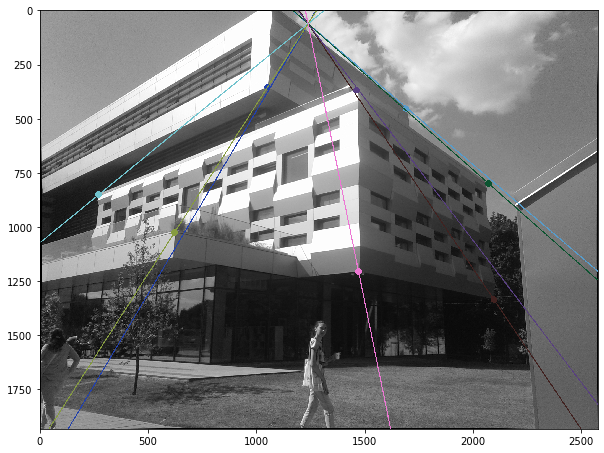

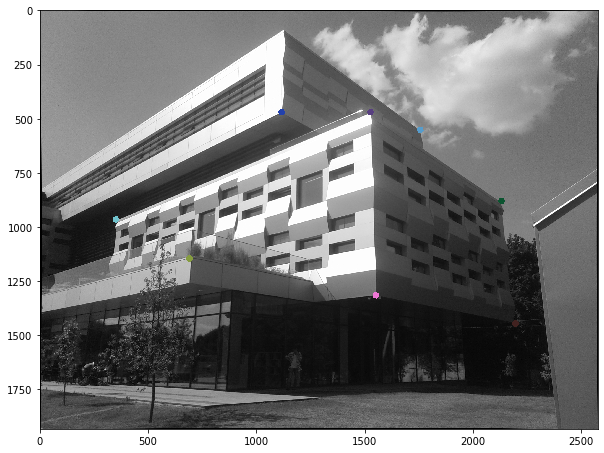

In [35]:
lines23 = find_epipolar_lines(pts_3, 2, F23)
img2_, img3_ = drawlines(img2_gray, img3_gray, lines23, pts_2, pts_3)
plt.figure(1)
plt.imshow(img2_)
plt.figure(2)
plt.imshow(img3_)
plt.show()

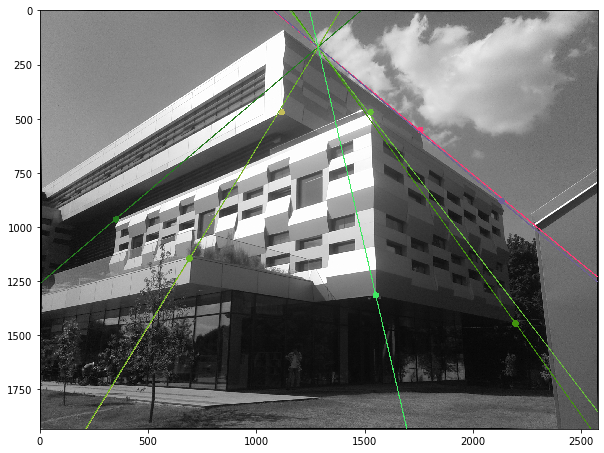

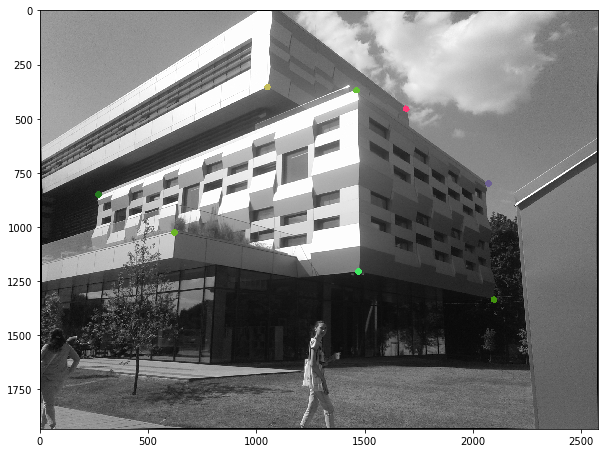

In [36]:
lines32 = find_epipolar_lines(pts_2,1, F23)
img2_, img3_ = drawlines(img3_gray, img2_gray, lines32, pts_3, pts_2)
plt.figure(1)
plt.imshow(img2_)
plt.figure(2)
plt.imshow(img3_)
plt.show()

#### 5. How stable is 8-point algorithm to point locations?

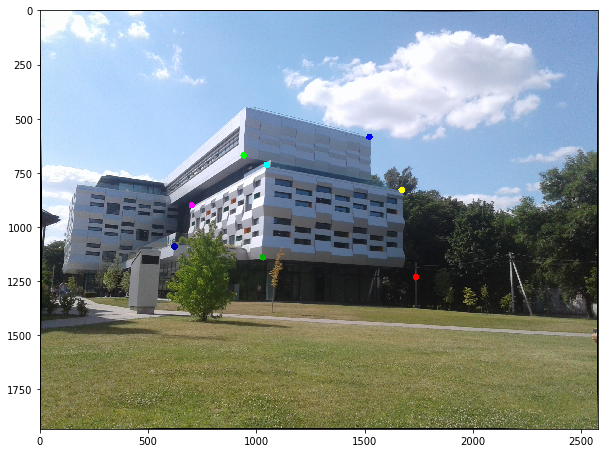

In [41]:
#consider one point shift via on OX,OY axis:
#center_sheptytskogo1.jpg
pts_1_ = np.array([   [1685+50,1180+50],
                    [940, 670],
                    [1520,585],
                    [1046, 714],
                    [1670, 830],
                    [700, 900],
                    [620,1090],
                    [1028,1140]
], np.int32)

img1 = cv2.imread(img_folder+img_list[0]).copy()
img1 = undistored(img1, matrix, dst)
for i, p in enumerate(pts_1_):
    img1 = cv2.circle(img1, (p[0], p[1]), 5,  color[i], 20)
display_image(img1)

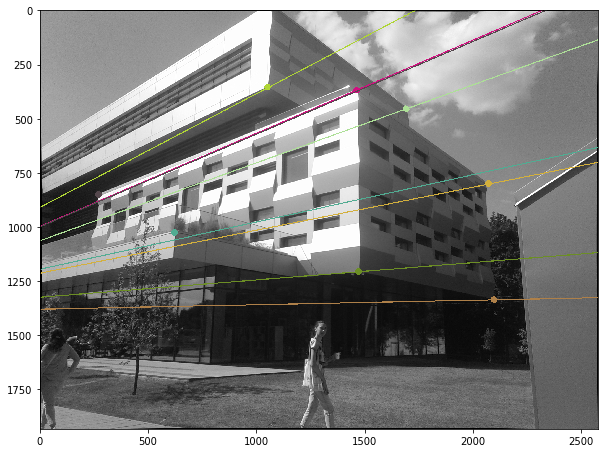

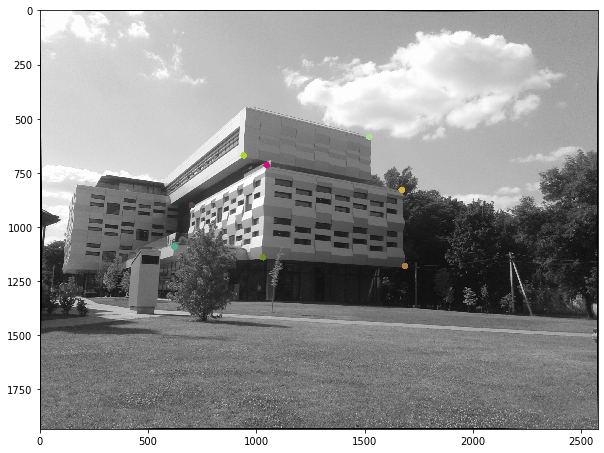

In [42]:
#build epipolar lines for pts_1 and pts_1_ 
lines21 = find_epipolar_lines(pts_1, 1, F12)
img1__, img2__ = drawlines(img2_gray, img1_gray, lines21, pts_2, pts_1)
plt.figure(1)
plt.imshow(img1__)
plt.figure(2)
plt.imshow(img2__)
plt.show()

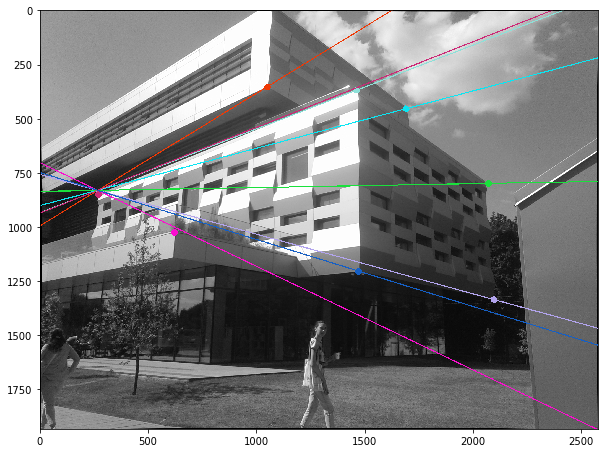

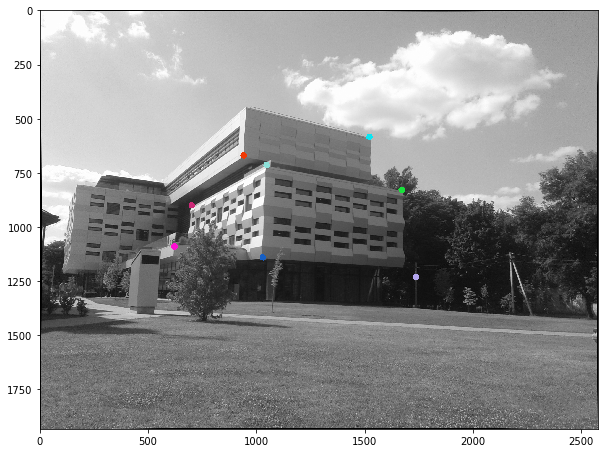

In [43]:
#find fundamental matrix
F12_ = find_fundamental_matrix(pts_1_,pts_2)

#build epipolar lines for pts_1 and pts_1_ 
lines21 = find_epipolar_lines(pts_1_, 1, F12_)
img1__, img2__ = drawlines(img2_gray, img1_gray, lines21, pts_2, pts_1_)
plt.figure(1)
plt.imshow(img1__)
plt.figure(2)
plt.imshow(img2__)
plt.show()

8-point algorithm is unstable. The minor change of point position on one image changes the angle between epipolar lines (epipole of image 2)

#### References:
    1. https://docs.opencv.org/master/da/de9/tutorial_py_epipolar_geometry.html
    2. https://github.com/PrimozGodec/machine-perception-ex5/blob/master/normalize2dpts.m
